<h1>Tests de détection de zones d'intérêt par analyse de profondeur (algorithme MiDaS)</h1>

<h2>Premier test</h2>

<p>L'utilisation de l'algorithme MiDaS se fait via PyTorch. Pour ce faire, la libraire timm est nécessaire via "pip install timm" en plus de PyTorch et OpenCV (pour la lecture de l'image)</p>

In [60]:
#Import package

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

Application de Midas sur une image : 

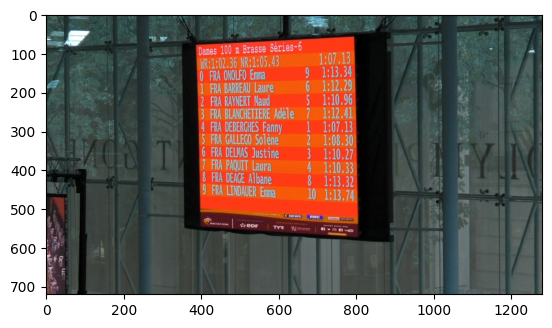

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


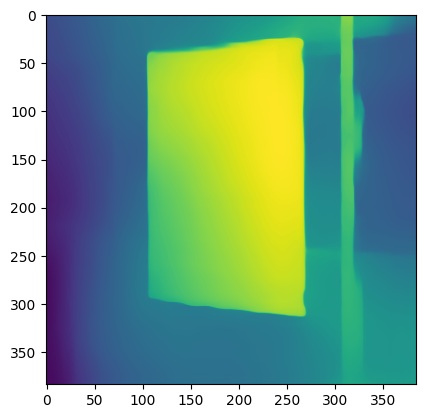

In [61]:
def midas_on_img(img_path, display=False):
    # Chargement de l'image
    img = cv2.imread(img_path)
    if display:
        plt.imshow(img)
        plt.show()
    # Chargement du modèle MiDaS pré-entraîné via torch.hub
    model = torch.hub.load('intel-isl/MiDaS', 'MiDaS')

    # Image preprocessing : Resize à la taille 384 * 384 (celle utilisée par le modèle)
    transform = Compose([
        ToTensor(),
        Resize((384, 384)),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(img).unsqueeze(0)

    # Utilisez le modèle pour prédire la profondeur de l'image
    with torch.no_grad():
        depth = model.forward(input_tensor)

    # Visualisation de la carte de profondeur
    if display:
        plt.imshow(depth.squeeze().cpu(), cmap='viridis')
        plt.show()
    return depth, img

img_path = '../data/natation/000004.png'
depth, input_img = midas_on_img(img_path, True)

[[1105.3524  1104.7969  1102.6952  ... 1312.7979  1279.0225  1269.0232 ]
 [1105.0059  1104.3041  1101.6656  ... 1341.5219  1319.1514  1312.4767 ]
 [1104.4391  1103.5278  1100.1245  ... 1385.1163  1379.9469  1378.2887 ]
 ...
 [ 583.19574  584.12305  586.79065 ... 1807.7256  1808.6415  1808.9076 ]
 [ 561.3745   563.61505  570.78357 ... 1812.5001  1811.5321  1811.2705 ]
 [ 547.1346   550.2436   560.3929  ... 1815.5259  1813.3265  1812.7189 ]]


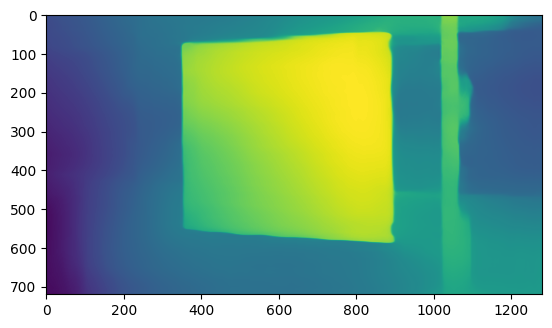

In [62]:
def tensor_to_ndarray(tensor, shape):
    prediction = torch.nn.functional.interpolate(
        tensor.unsqueeze(1),
        size=shape[:2],
        mode="bicubic",
        align_corners=False,
    ).squeeze()

    output = prediction.cpu().numpy()

    return output

depth_array = tensor_to_ndarray(depth, input_img.shape)
print(depth_array)
plt.imshow(depth_array)

Normalisation du tableau, dans des valeurs entre 0 et 255 (uint8, format utilisé par OpenCV) :

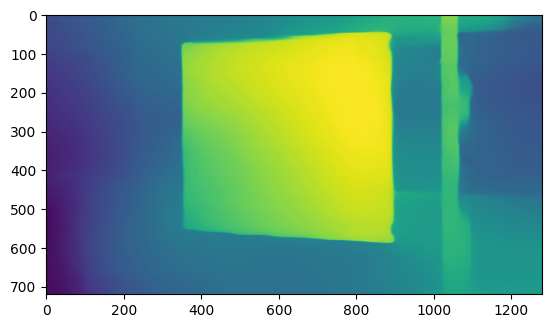

In [63]:
def normalize_array(array):
    return np.uint8(255 * array / np.max(array))

depth_img = normalize_array(depth_array)
plt.imshow(depth_img)

Détection des contours : 

In [64]:
## Utilisez la méthode Canny pour détecter les contours de l'image
# img_canny = cv2.Canny(depth_img, 100, 200)

## Utilisez la fonction findContours pour trouver les contours de l'image
# contours, hierarchy = cv2.findContours(img_canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

## Créez une copie de l'image pour dessiner les contours
# img_contours = np.copy(input_img)

## Dessinez les contours sur l'image copiée
# cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 3)

## Affichez l'image avec les contours dessinés
# cv2.imshow('Contours', img_contours)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

Exécution beaucoup trop longue avec la méthode Canny sur OpenCV, (après +1h, pas de résultat).

Réalisons le manuellement via calculs de gradients :

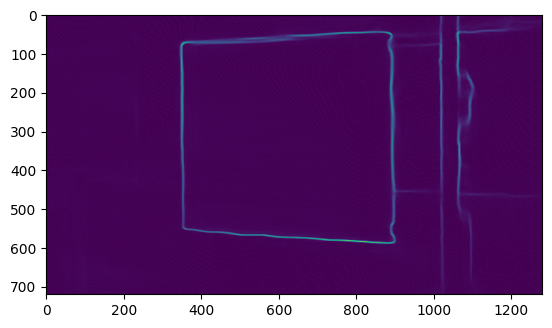

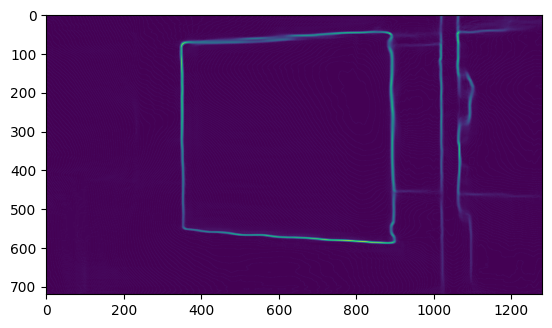

In [152]:
def get_gradients(gray_img, display=False):
    """Takes a video and returns its contours thanks to gradients computation"""
    scale = 1
    delta = 0
    ddepth = cv2.CV_32F

    # Grad calculations
    grad_x = cv2.Sobel(gray_img, ddepth, 1, 0, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    grad_y = cv2.Sobel(gray_img, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    grad_xy = cv2.Sobel(gray_img, ddepth, 1, 1, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)

    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)
    abs_grad_xy = cv2.convertScaleAbs(grad_xy)
    
    grad = cv2.addWeighted(abs_grad_x, 1/3, abs_grad_y, 1/3, 0)
    grad = cv2.addWeighted(grad, 1, abs_grad_xy, 1/3, 0)

    if display:
        plt.imshow(grad)
        plt.show()

    return grad

grad = get_gradients(depth_img, True) # Gradient on original img

img_blur = cv2.GaussianBlur(depth_img, (5, 5), 0)
grad_2 = get_gradients(img_blur, True) # Gradient on img + gaussian blur

Avec et sans flou Gaussien, les résultats sont similaires. Ce prétraitement ne semble pas nécessaire. Les contours semblent globalement bons.

Récupérons les formes associées à ces contours :

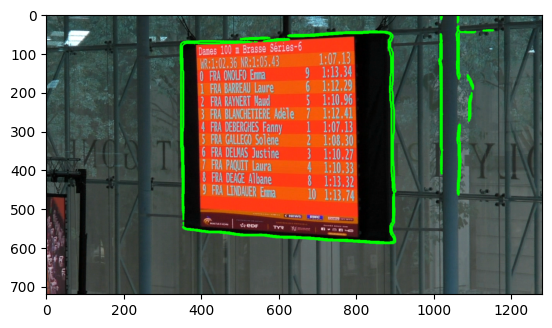

In [66]:
def get_contours(grad, input_img, display=False):
    # Normalisation des valeurs de l'image entre 0 et 255, et conversion du tableau en entiers 8 bits
    img_sobel = cv2.normalize(grad, None, 0, 255, cv2.NORM_MINMAX)
    img_sobel = img_sobel.astype(np.uint8)

    # Seuil pour binariser l'image
    _, img_thresh = cv2.threshold(img_sobel, 50, 255, cv2.THRESH_BINARY)

    # findContours pour trouver les contours de l'image
    contours, _ = cv2.findContours(img_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if display:
        # Copie de l'image pour dessiner les contours
        img_contours = np.copy(input_img)
        # Dessin des contours sur l'image copiée
        cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 3)
        plt.imshow(img_contours)
        plt.show()
    
    return contours

contours = get_contours(grad, input_img, True)

Test en récupérant les quadrilatères uniquement parmi ces contours : 

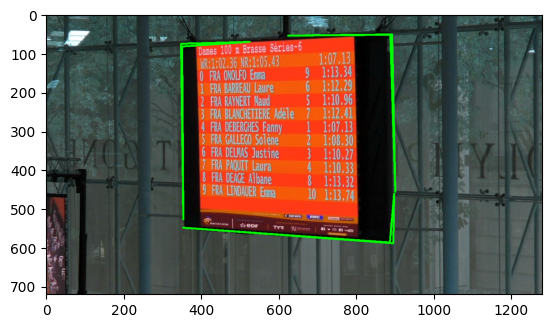

3


In [67]:
def clean_contours(contours, input_img, display=False, min_points_poly=4):
    # loop sur les contours pour récupérer les quadrilatères
    cleaned_contours = []
    for contour in contours:
        peri = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
        if len(approx) <= 4 and len(approx) >= min_points_poly:
            cleaned_contours.append(approx)

    if display:
        # Copie de l'image pour dessiner les contours
        img_contours = np.copy(input_img)

        # Dessin des contours sur l'image copiée
        cv2.drawContours(img_contours, cleaned_contours, -1, (0, 255, 0), 3)

        # Affichage de l'image avec les contours dessinés
        plt.imshow(img_contours)
        plt.show()

    return cleaned_contours

cleaned_contours = clean_contours(contours, input_img, True)

print(len(cleaned_contours))

Avec les quadrilatères <b>convexes</b> uniquement :

0


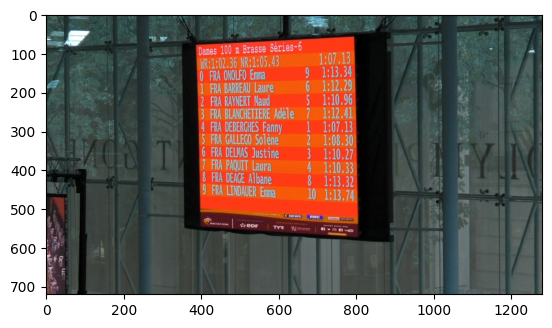

In [68]:
threshold = 3

cleaned_contours_convex = []
for contour in contours:
    peri = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
    if len(approx) == 4:

        hull = cv2.convexHull(approx,returnPoints = False)
        defects = cv2.convexityDefects(approx,hull)

        sum_of_defects=0
        for i in range(defects.shape[0]):
            s,e,f,d = defects[i,0]
            sum_of_defects=sum_of_defects+d

        if sum_of_defects <= threshold:
            cleaned_contours_convex.append(approx)

print(len(cleaned_contours_convex))

# Copie de l'image pour dessiner les contours
img_contours_3 = np.copy(input_img)

# Dessin des contours sur l'image copiée
cv2.drawContours(img_contours_3, cleaned_contours_convex, -1, (0, 255, 0), 3)

# Affichage de l'image avec les contours dessinés
plt.imshow(img_contours_3)
plt.show()

Même avec un haut seuil, cela ne fonctionne pas aucun quadrilatère convexe n'est récupéré. Cela s'explique car aucun des quadrilatères ne prend toute la zone d'affichage, ils modélisent seulement des arêtes.

<h2>Récupération du quadrilatère maximum avec les points</h2>

Il reste à combiner les points présents pour former un quadrilatère de surface maximale, qui sera notre zone d'intérêt : 

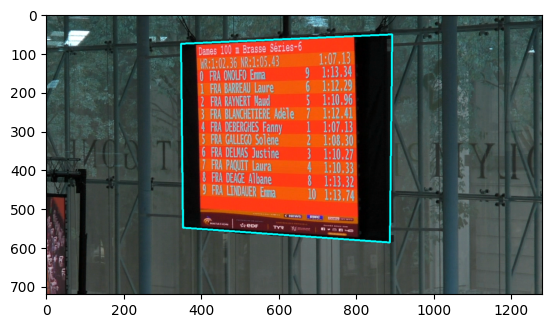

In [69]:
import itertools

def quad_area(points):
    """
    Calcule l'aire d'un quadrilatère à partir des coordonnées de ses sommets, via séparation en deux triangles et calcule de déterminant
    """

    x1, y1 = points[0]
    x2, y2 = points[1]
    x3, y3 = points[2]
    x4, y4 = points[3]
    return 0.5 * abs(x1*y2 + x2*y3 + x3*y4 + x4*y1 - x2*y1 - x3*y2 - x4*y3 - x1*y4)

def largest_quadrilateral(points):
    """
    Trouve le quadrilatère avec la plus grande aire à partir d'un ensemble de points.
    """
    largest_area = 0.0
    largest_quadrilateral = None

    # Génére toutes les combinaisons de quatre points parmi les points donnés et trouve le maximum
    for p1, p2, p3, p4 in itertools.combinations(points, 4):
        area = quad_area([p1, p2, p3, p4])
        
        if area > largest_area:
            largest_quadrilateral = [p1, p2, p3, p4]
            largest_area = area

    return np.array(largest_quadrilateral).reshape((-1, 1, 2)), largest_area

def get_largest_quadrilateral_from_contours(cleaned_contours, input_img, display=False):
    points_list = []
    for contour in cleaned_contours:
        [points_list.append(point[0]) for point in contour]

    interest_zone, area = largest_quadrilateral(points_list)

    if display:
        img_contours = np.copy(input_img)

        # Dessin du polygone sur l'image
        cv2.polylines(img_contours, [interest_zone], True, (0, 255, 255), thickness=3)

        plt.imshow(img_contours)
        plt.show()
    
    return interest_zone, area


interest_zone, area = get_largest_quadrilateral_from_contours(cleaned_contours, input_img, True)

<h2>Fonction globale et test sur d'autres images</h2>

In [77]:
# Global function

def detect_interest_zone(img_path, display=False, display_last=True, min_points_polyg=4):
    depth, input_img = midas_on_img(img_path, display)
    depth_array = tensor_to_ndarray(depth, input_img.shape)
    depth_img = normalize_array(depth_array)
    grad = get_gradients(depth_img, display) # Gradient on img
    contours = get_contours(grad, input_img, display)
    cleaned_contours = clean_contours(contours, input_img, display, min_points_polyg)

    if len(cleaned_contours) == 0:
        return "No contour found"

    interest_zone, _ = get_largest_quadrilateral_from_contours(cleaned_contours, input_img, display or display_last)

    return interest_zone

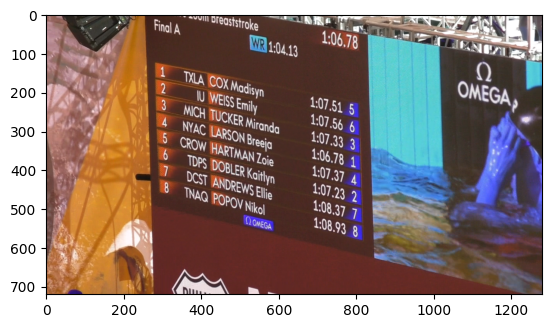

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


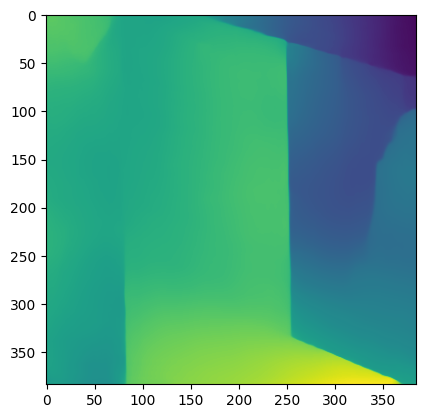

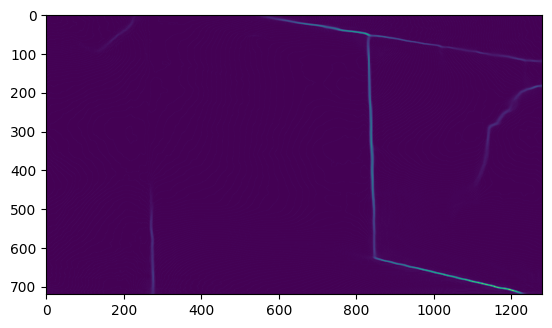

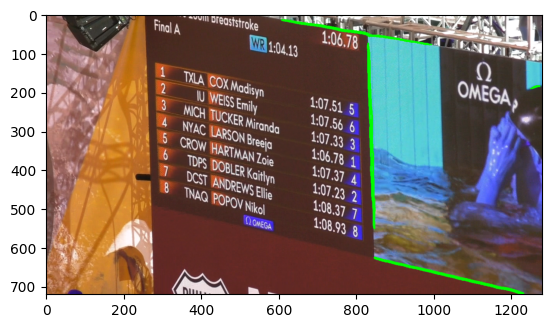

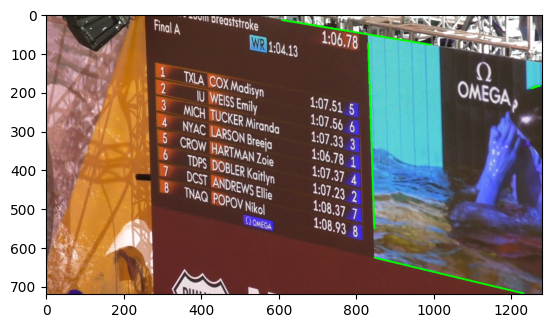

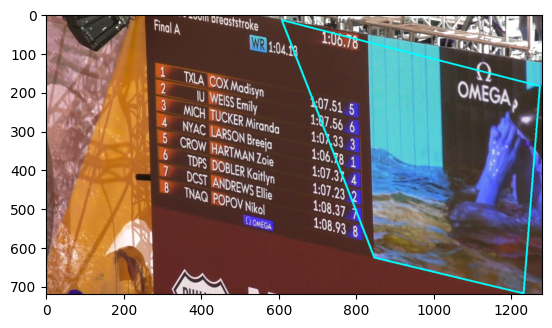

array([[[ 847,  626]],

       [[1232,  718]],

       [[1274,  185]],

       [[ 608,   15]]], dtype=int32)

In [78]:
detect_interest_zone('../data/natation/000001.png', True, True, 0)

Sur cette image, c'est le mauvais rectangle qui est récupéré

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


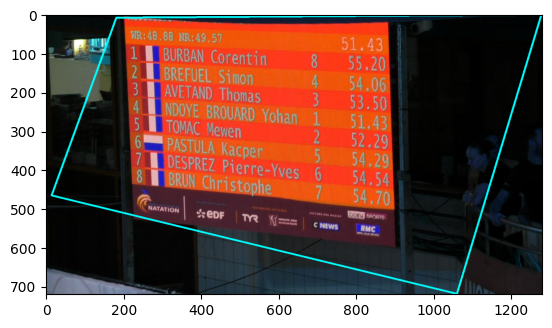

array([[[1060,  719]],

       [[  14,  466]],

       [[ 181,    9]],

       [[1278,    1]]], dtype=int32)

In [80]:
detect_interest_zone('../data/natation/000000.png', False, True, 0)

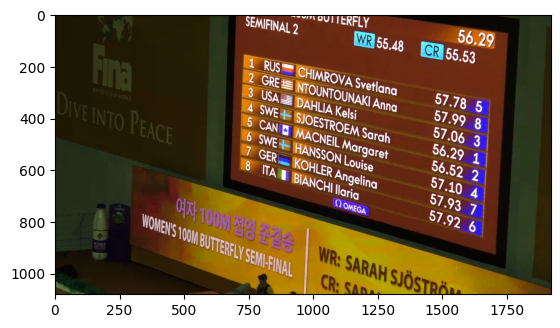

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


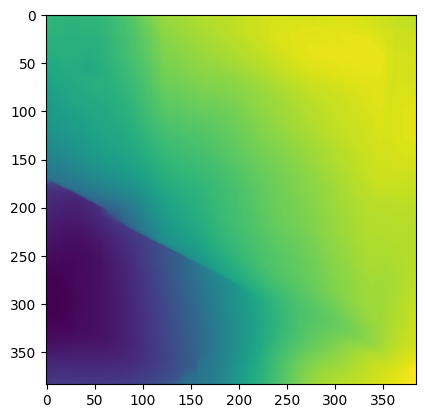

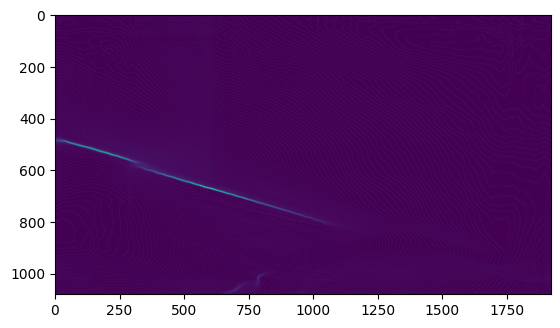

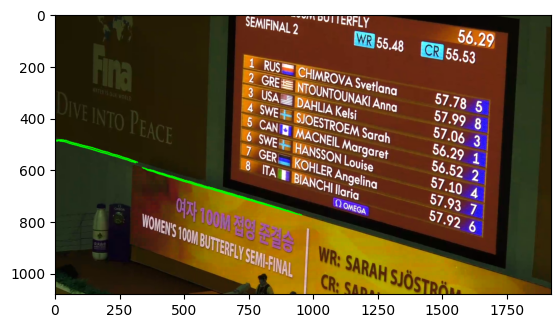

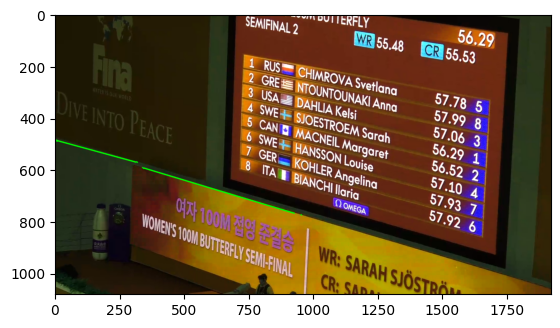

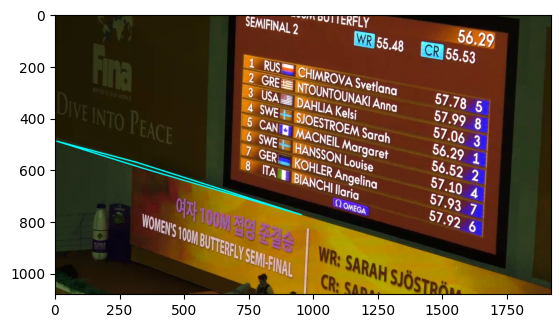

array([[[952, 774]],

       [[341, 595]],

       [[  6, 490]],

       [[313, 571]]], dtype=int32)

In [82]:
detect_interest_zone('../data/natation/000002.png', True, True, 0)

Un échec de plus, malgré que le découpage après estimation de profondeur semble cohérent.

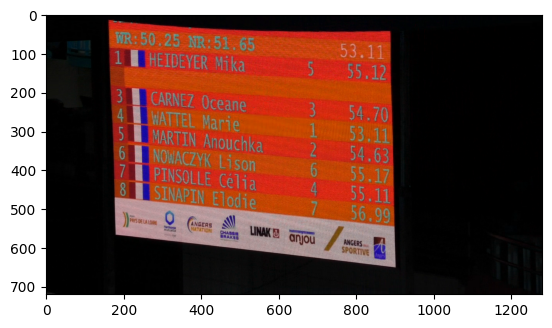

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


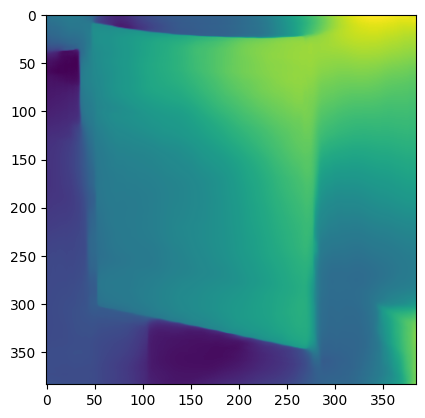

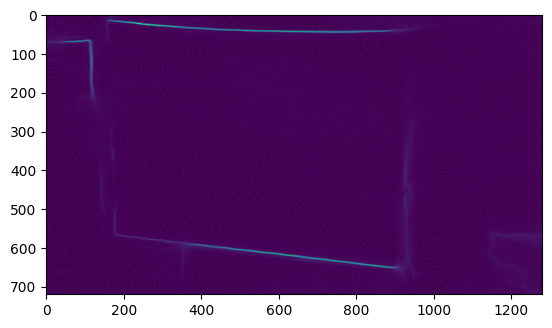

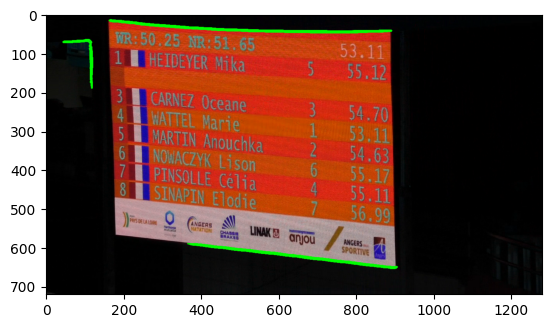

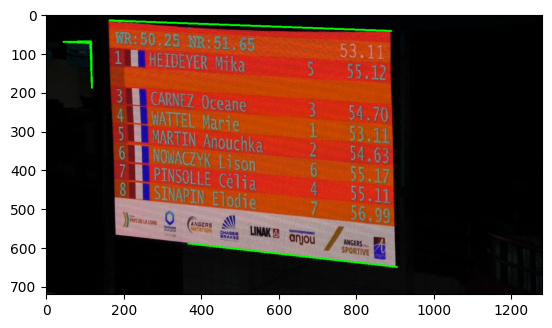

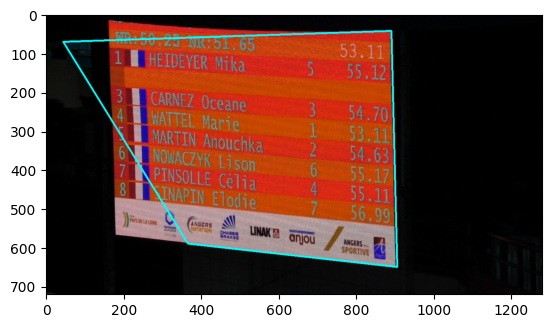

array([[[906, 650]],

       [[366, 590]],

       [[ 44,  71]],

       [[891,  43]]], dtype=int32)

In [85]:
detect_interest_zone('../data/natation/000003.png', True, True, 0)

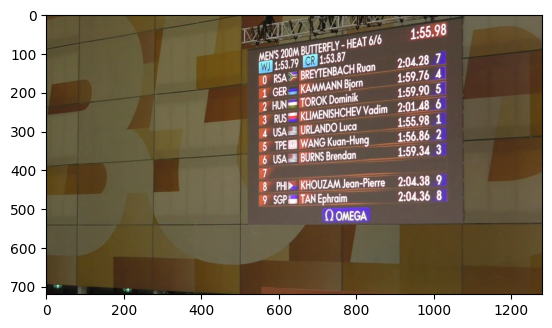

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


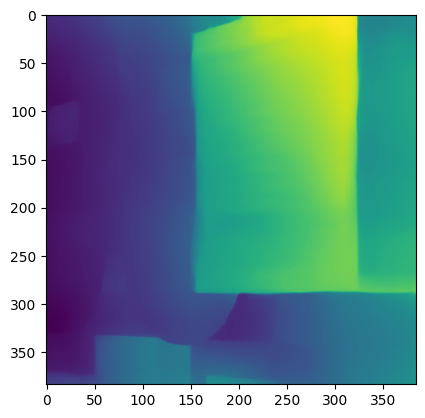

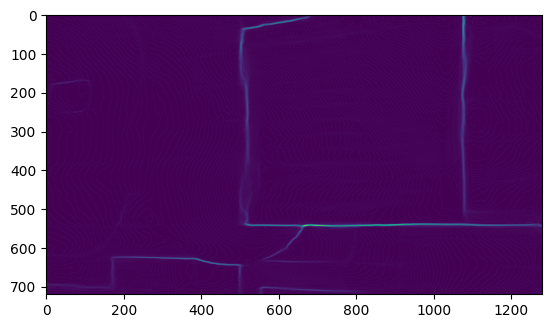

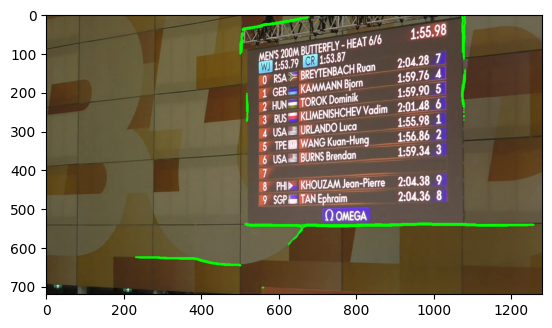

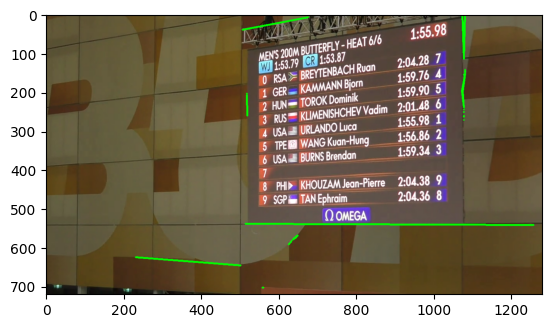

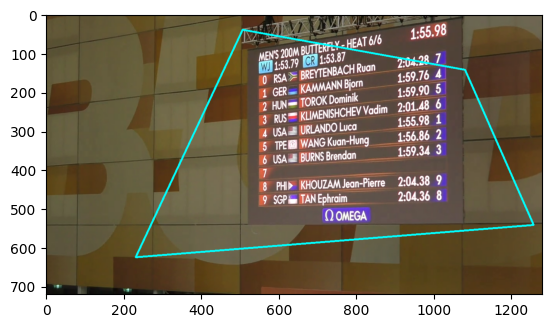

array([[[ 231,  625]],

       [[1258,  542]],

       [[1081,  143]],

       [[ 507,   40]]], dtype=int32)

In [87]:
detect_interest_zone('../data/natation/000006.png', True, True, 0)

Les résultats ne sont pas les plus concluants via le calcul de contours sur l'image. 

Néanmoins avant calcul des contours, les couleurs semblent cohérentes. 

Peut-être que la simple application d'un seuil à ce moment permettrait d'avoir un résultat concluant ?

<h2>Test de seuillage</h2>

Pour la suite, la partie de calcul des contours est abandonnée.

A la place, un seuil sera réalisé pour créer un masque.

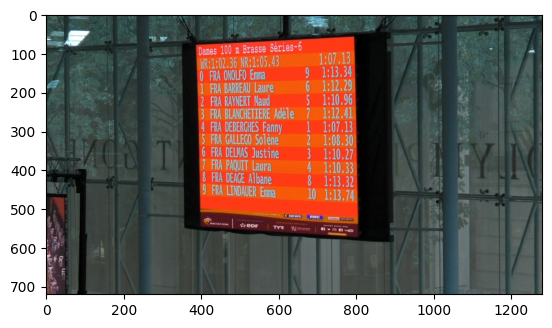

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


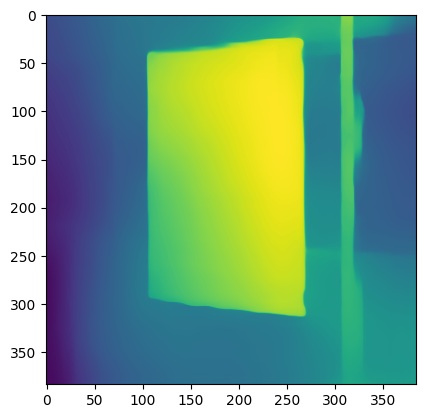

In [88]:
img_path = '../data/natation/000004.png'
depth, input_img = midas_on_img(img_path, True)
depth_array = tensor_to_ndarray(depth, input_img.shape)
depth_img = normalize_array(depth_array)

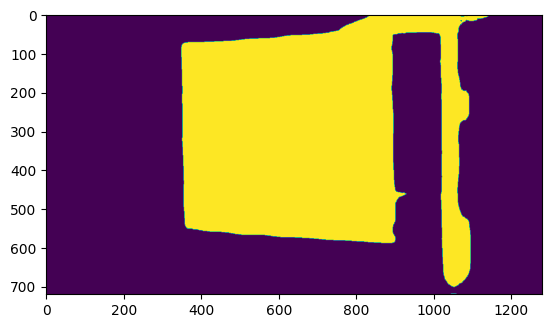

In [96]:
_, img_thresh = cv2.threshold(depth_img, 170, 255, cv2.THRESH_BINARY) # Application du seuil

plt.imshow(img_thresh)
plt.show()

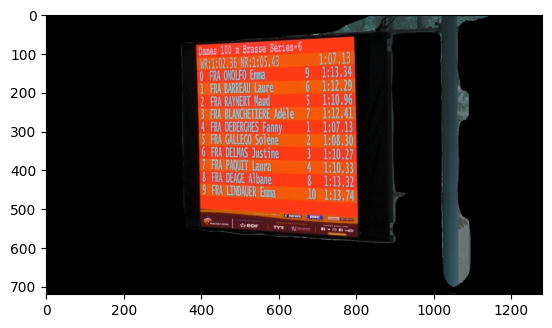

In [104]:
def apply_threshold_mask(array_1, thresh_array, display=False):
    array_to_mask = np.copy(array_1)
    mask = thresh_array / 255
    masked_array = np.zeros_like(array_to_mask)
    masked_array[:,:,0] = array_to_mask[:,:,0] * mask
    masked_array[:,:,1] = array_to_mask[:,:,1] * mask
    masked_array[:,:,2] = array_to_mask[:,:,2] * mask

    if display:
        plt.imshow(masked_array)
        plt.show()

    return masked_array

masked_array = apply_threshold_mask(input_img, img_thresh, True)

Sur cette première image, le résultat semble convaincant, l'OCR est réalisable sur cette image et on garde les informations utiles

<h3>Fonction et test sur d'autres images</h3>

In [130]:
def detect_interest_zone_threshold(img_path, threshold=170, display_all=False, display_last=False, show_first=False):
    depth, input_img = midas_on_img(img_path, display_all)

    #--------------  Test only section ------------------#
    if show_first and not display_all:
        plt.imshow(input_img)
        plt.show()
    #-------------- /Test Only section ------------------#

    depth_array = tensor_to_ndarray(depth, input_img.shape)
    depth_img = normalize_array(depth_array)
    _, img_thresh = cv2.threshold(depth_img, threshold, 255, cv2.THRESH_BINARY)
    if display_all:
        plt.imshow(img_thresh)
        plt.show()
    return apply_threshold_mask(input_img, img_thresh, display_all or display_last)
    

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


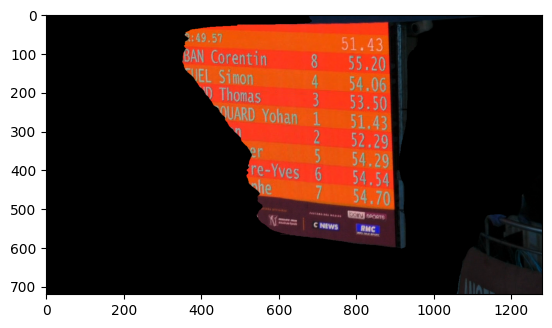

In [111]:
zone = detect_interest_zone_threshold("../data/natation/000000.png", display_last=True)

Seuil à ajuster : 

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


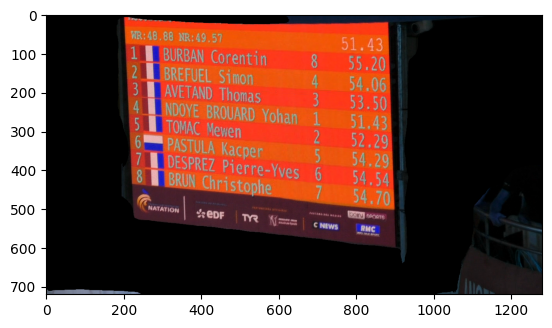

In [116]:
zone = detect_interest_zone_threshold("../data/natation/000000.png", display_last=True, threshold=150)

Résultat cohérent, à tester avec le même seuil sur d'autres images

Toutes les images avec un threshold à 150 -> 255

Image 0 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


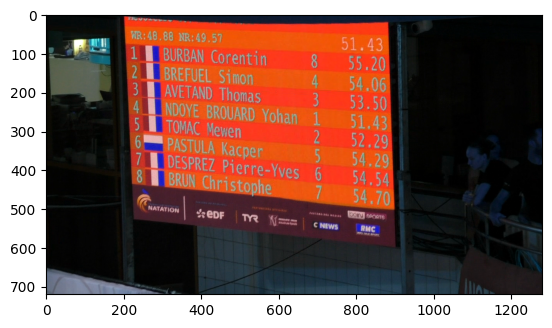

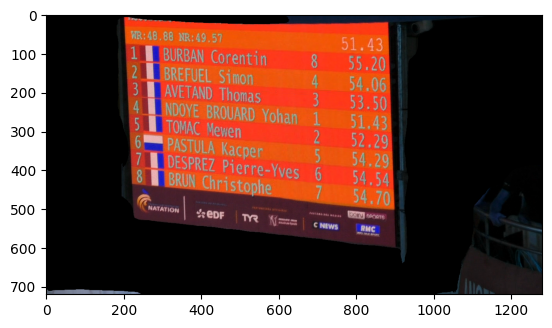

----------------------------------------------------
Image 1 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


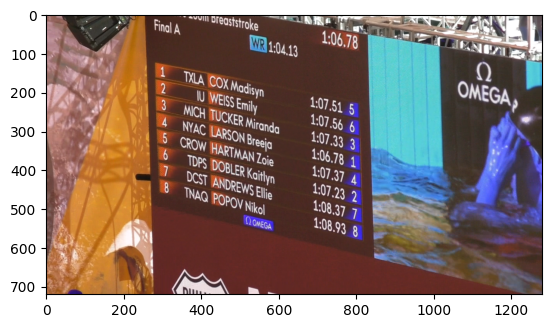

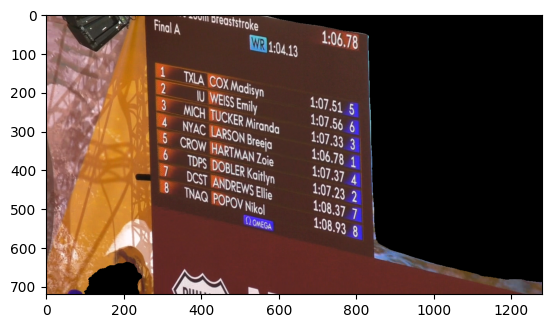

----------------------------------------------------
Image 2 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


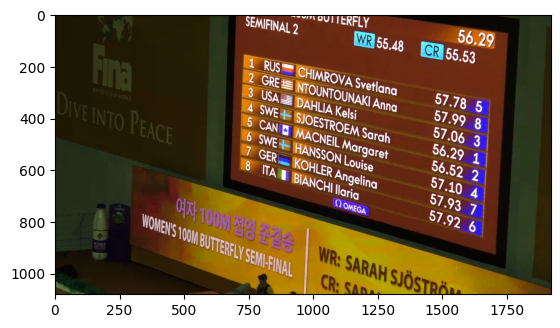

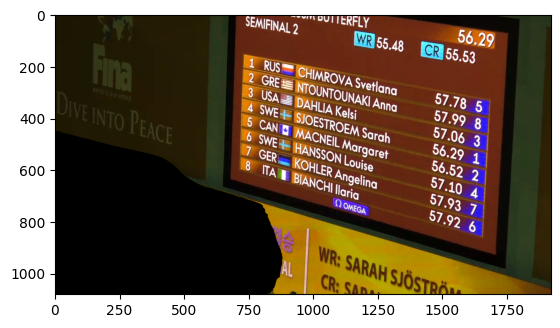

----------------------------------------------------
Image 3 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


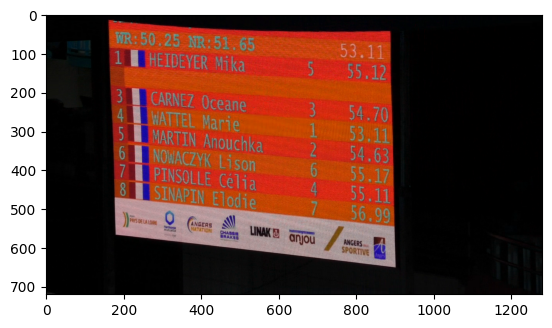

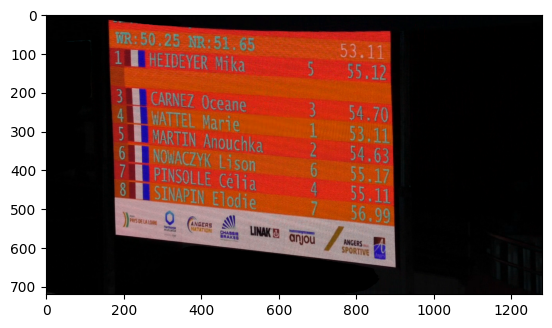

----------------------------------------------------
Image 4 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


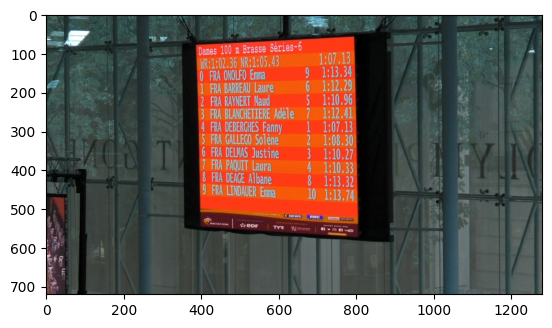

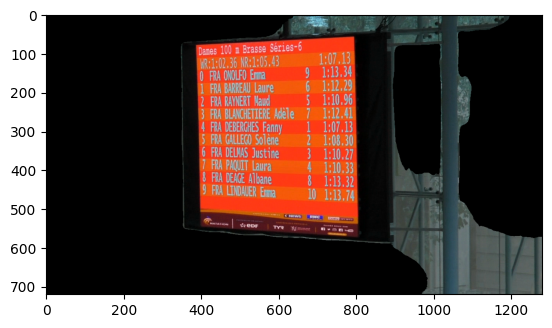

----------------------------------------------------
Image 5 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


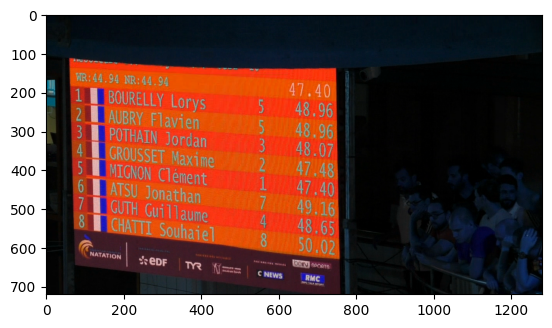

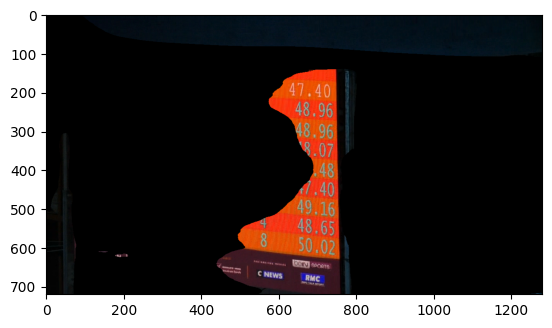

----------------------------------------------------
Image 6 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


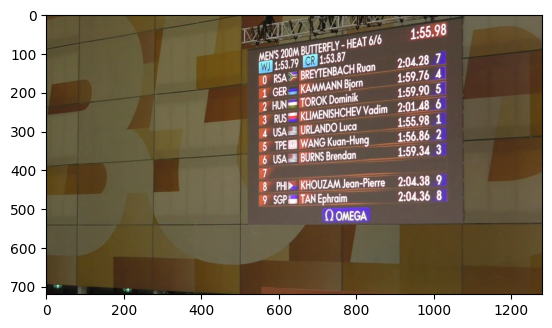

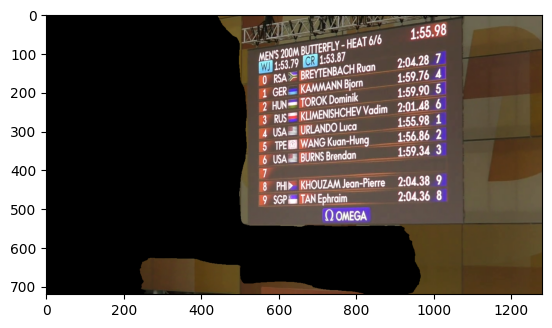

----------------------------------------------------
Image 7 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


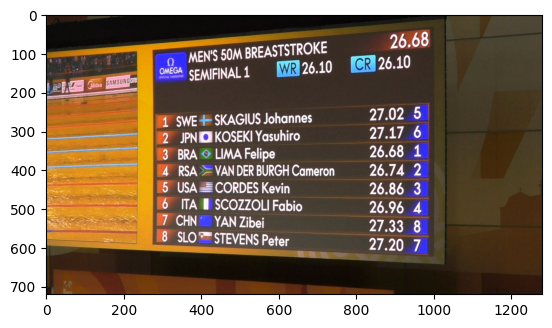

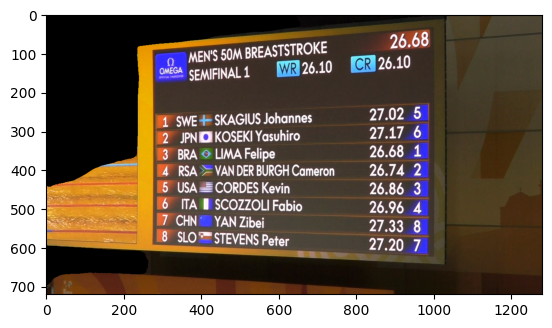

----------------------------------------------------
Image 8 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


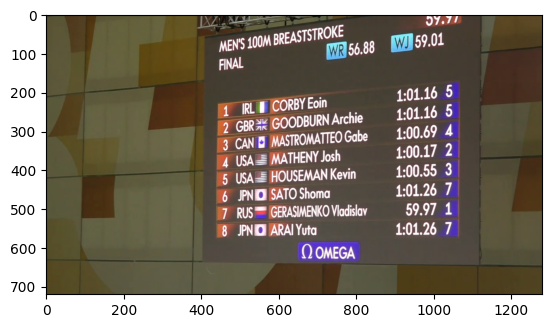

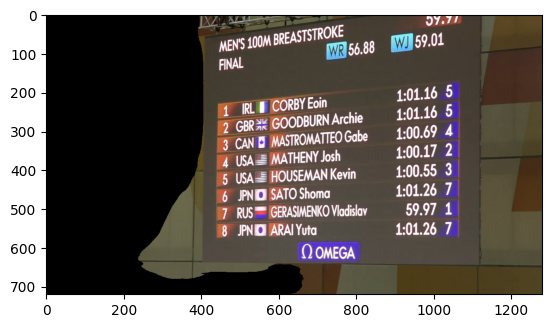

----------------------------------------------------
Image 9 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


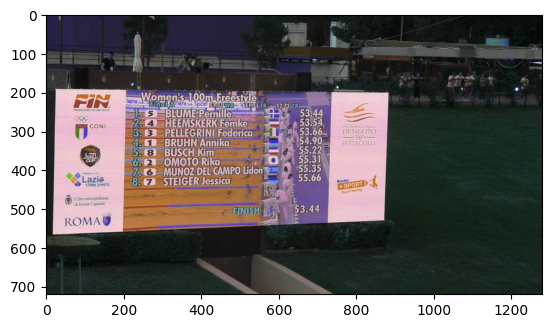

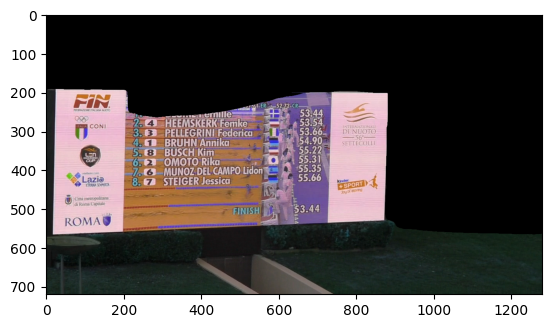

----------------------------------------------------
Image 10 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


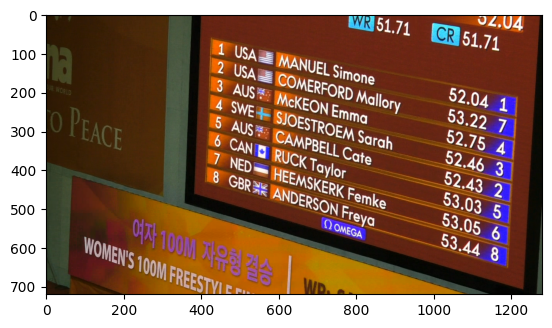

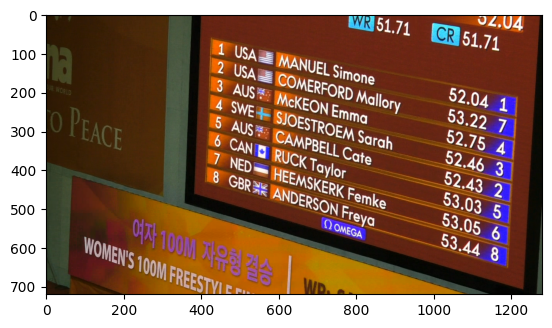

----------------------------------------------------
Image 11 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


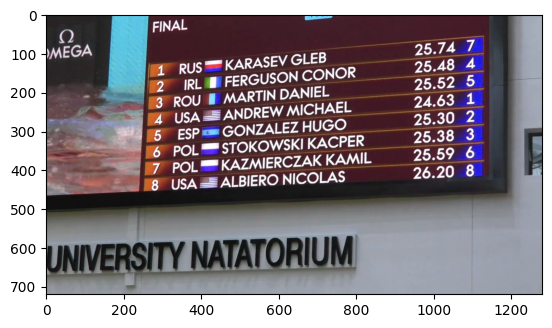

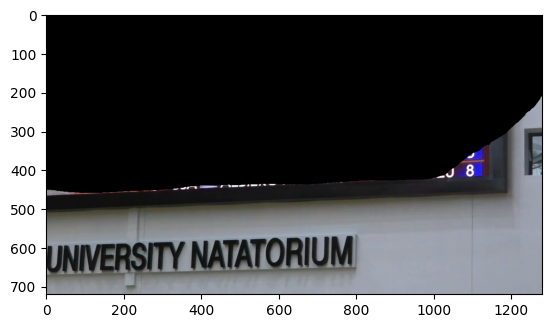

----------------------------------------------------
Image 12 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


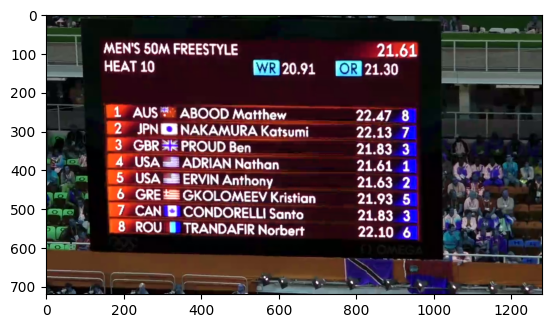

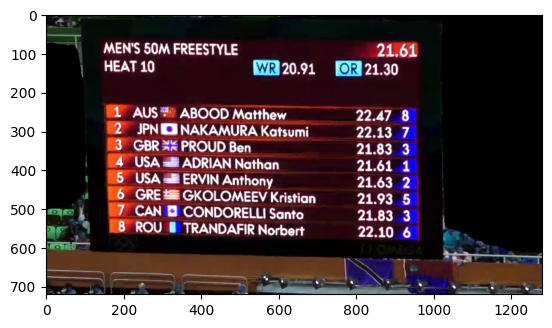

----------------------------------------------------
Image 13 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


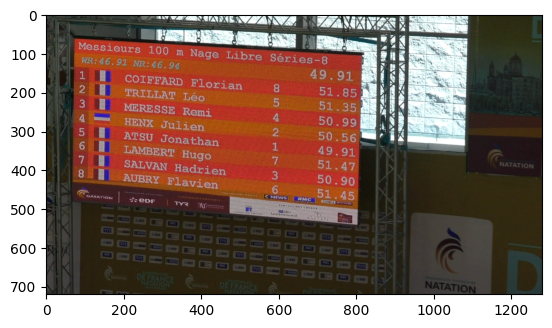

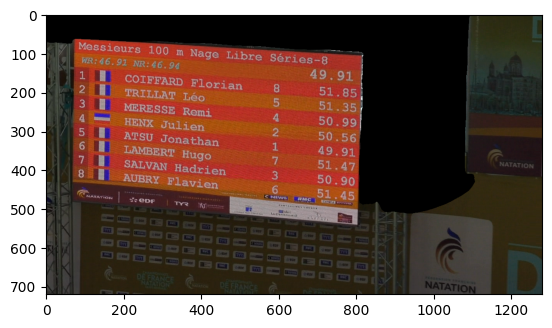

----------------------------------------------------
Image 14 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


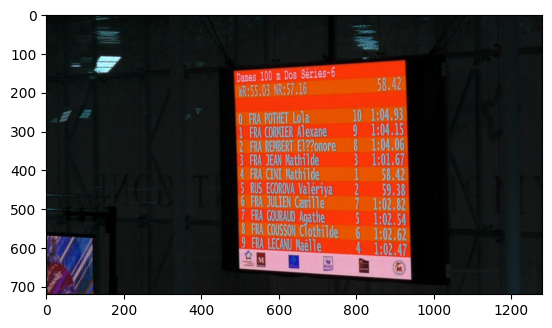

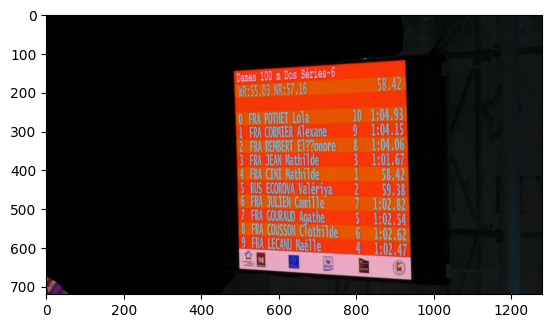

----------------------------------------------------


In [131]:
for i in range(15):
    print("Image {} :".format(i))
    number = "0" + str(i) if i < 10 else i
    zone = detect_interest_zone_threshold("../data/natation/0000{}.png".format(number), display_last=True, threshold=150, show_first=True)
    print("----------------------------------------------------")

Des tests ont été réalisés avec d'autres seuils mais pour des résultats moins bons que ceux-ci. Ici, on arrive à un résultat correct sur une partie des images, sans être particulièrement remarquable. On perd en informations sur d'autres et la méthode n'est absolument pas adaptée pour les images pour lesquelles les différences de profondeurs ne sont pas si marquées.

<h3>Tests sur le tennis de table</h3>

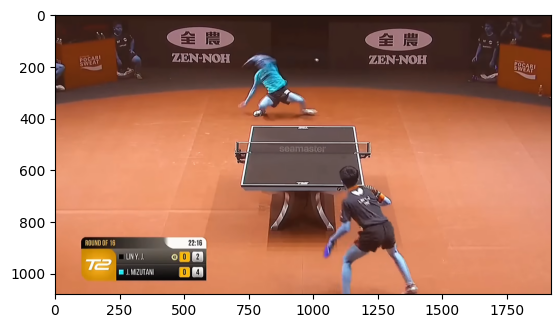

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


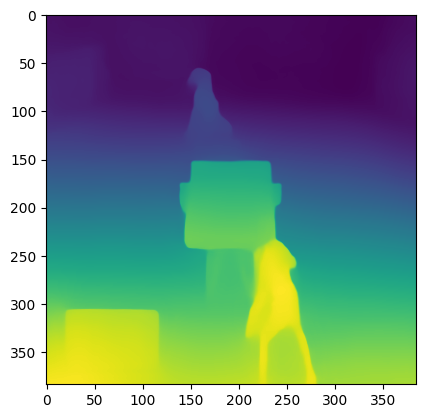

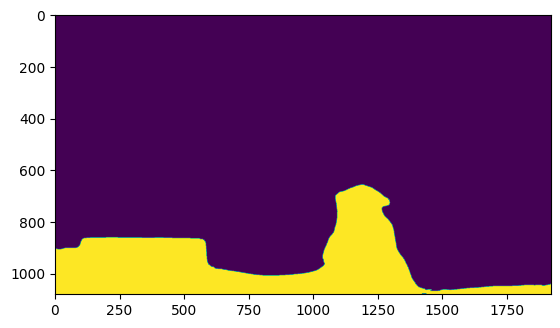

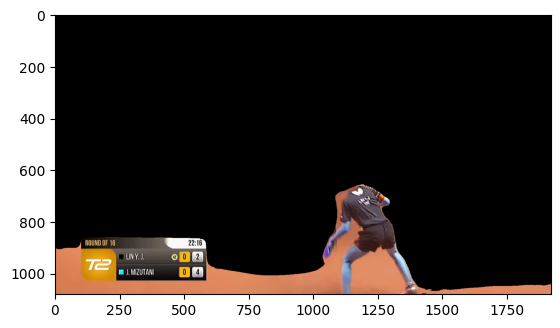

In [139]:
zone = detect_interest_zone_threshold("../data/tennis de table/4.png", display_all=True, threshold=220)

La zone du dessous est la plus proche de la caméra donc logiquement mise en évidence. On observe tout de même une couleur intensé sur le tableau d'affichage, à confirmer si elle est exploitable.

Il faut réaliser les tests sur plusieurs images, avec un seuil plus court.

Image 0 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


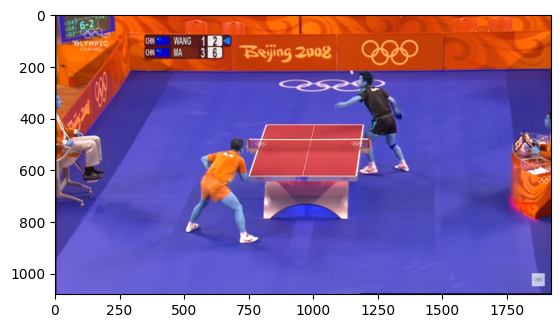

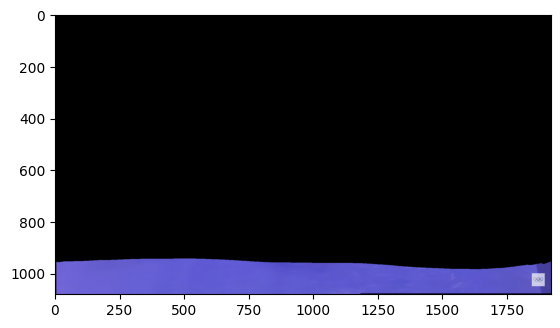

----------------------------------------------------
Image 1 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


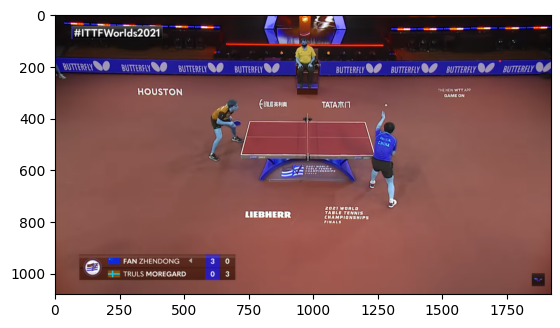

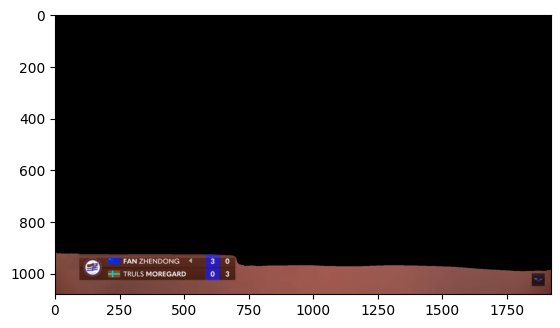

----------------------------------------------------
Image 2 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


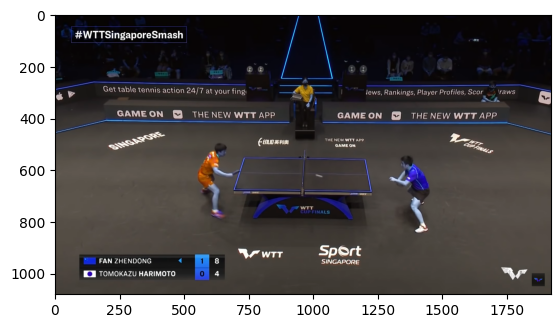

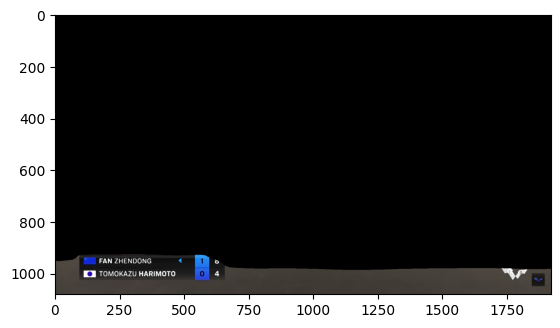

----------------------------------------------------
Image 3 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


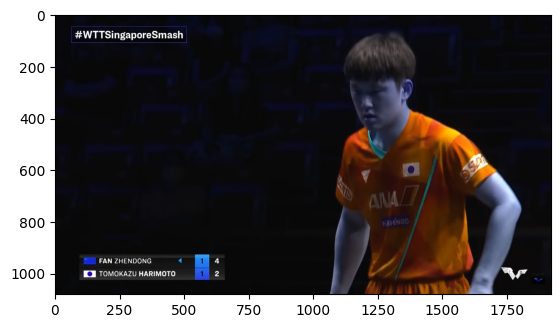

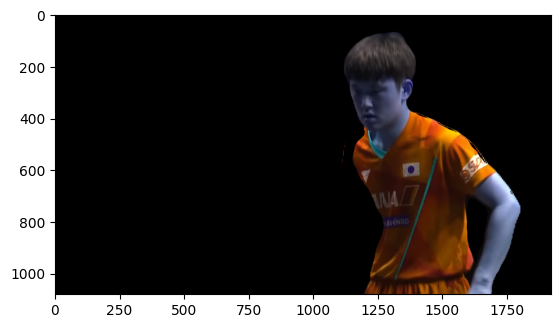

----------------------------------------------------
Image 4 :


Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


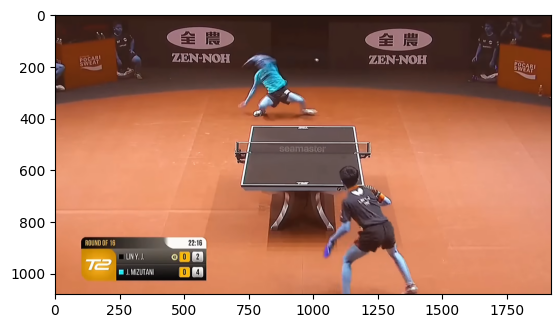

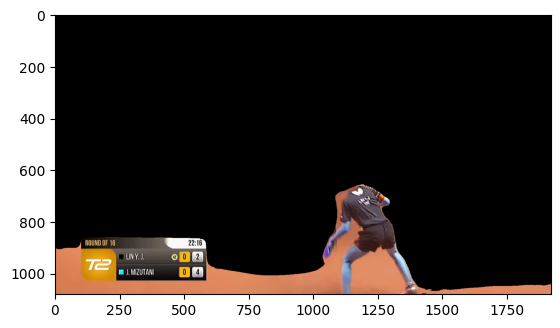

----------------------------------------------------


In [140]:
for i in range(5):
    print("Image {} :".format(i))
    zone = detect_interest_zone_threshold("../data/tennis de table/{}.png".format(i), display_last=True, threshold=220, show_first=True)
    print("----------------------------------------------------")

Les résultats appliqués au tennis de table montrent uniquement que la partie gardée est systématiquement celle du bas (logique, c'est la plus proche de la caméra et nous réalisons une estimation de profondeur). Le score ne ressort pas particulièrement et il n'y a donc aucun intérêt à réaliser cette méthode.

Essayons cette fois-ci en cropant le bas et le haut de l'image, pour voir si la zone d'affichage ressort plus.

In [148]:
def midas_on_cv_img(img, display=False):
    # Chargement du modèle MiDaS pré-entraîné via torch.hub
    model = torch.hub.load('intel-isl/MiDaS', 'MiDaS')

    # Image preprocessing : Resize à la taille 384 * 384 (celle utilisée par le modèle)
    transform = Compose([
        ToTensor(),
        Resize((384, 384)),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(img).unsqueeze(0)

    # Utilisez le modèle pour prédire la profondeur de l'image
    with torch.no_grad():
        depth = model.forward(input_tensor)

    # Visualisation de la carte de profondeur
    if display:
        plt.imshow(depth.squeeze().cpu(), cmap='viridis')
        plt.show()
    return depth, img

def detect_interest_zone_thresh_inv(img_path, threshold=190, split_factor=0.8, display_all=False, display_last=False, show_first=False):
    """To use for sports like table tennis where score is at the bottom or the top"""
    # Chargement de l'image
    img = cv2.imread(img_path)
    if display_all:
        plt.imshow(img)
        plt.show()
    
    N = img.shape[0]
    img_bottom = img[int(split_factor*N):, :, :]
    depth, input_img = midas_on_cv_img(img_bottom, display_all)

    #--------------  Test only section ------------------#
    if show_first and not display_all:
        plt.imshow(input_img)
        plt.show()
    #-------------- /Test Only section ------------------#

    depth_array = tensor_to_ndarray(depth, input_img.shape)
    depth_img = normalize_array(depth_array)
    _, img_thresh = cv2.threshold(depth_img, threshold, 255, cv2.THRESH_BINARY_INV)
    if display_all:
        plt.imshow(img_thresh)
        plt.show()
    return apply_threshold_mask(input_img, img_thresh, display_all or display_last)
    

Image 0 :


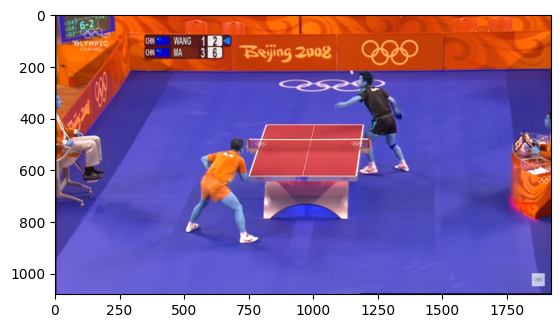

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


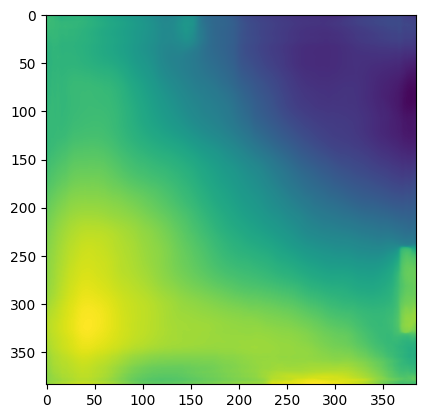

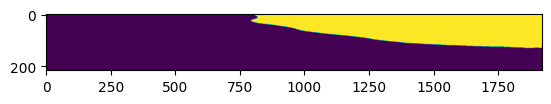

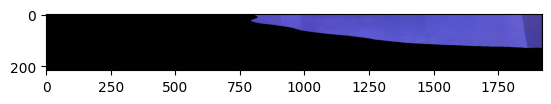

----------------------------------------------------
Image 1 :


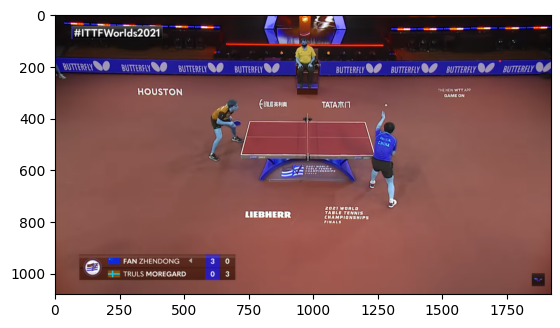

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


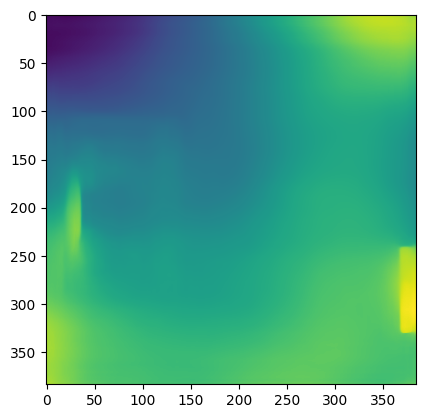

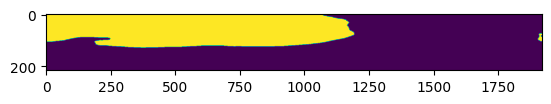

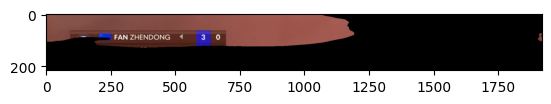

----------------------------------------------------
Image 2 :


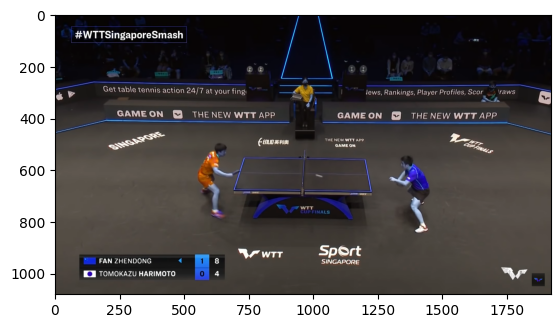

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


Loading weights:  None


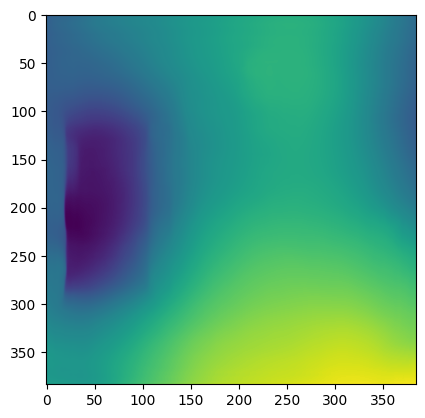

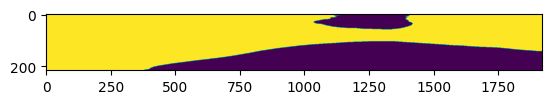

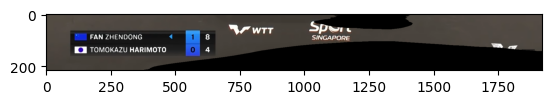

----------------------------------------------------
Image 3 :


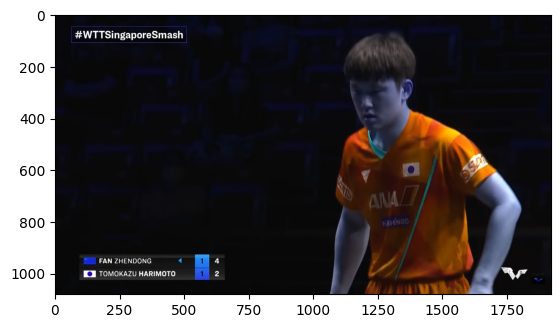

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


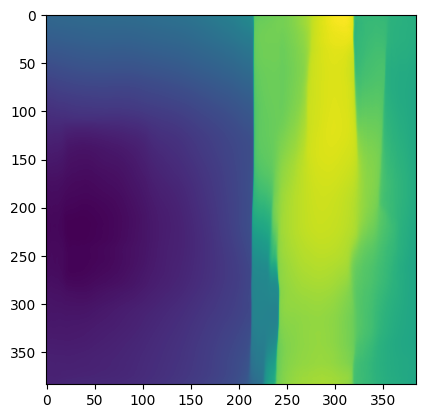

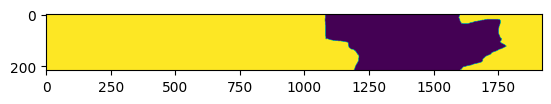

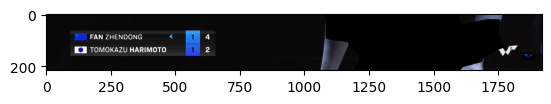

----------------------------------------------------
Image 4 :


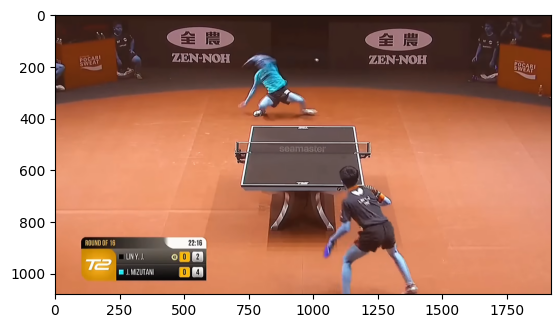

Using cache found in C:\Users\salah/.cache\torch\hub\intel-isl_MiDaS_master


Loading weights:  None


Using cache found in C:\Users\salah/.cache\torch\hub\facebookresearch_WSL-Images_main


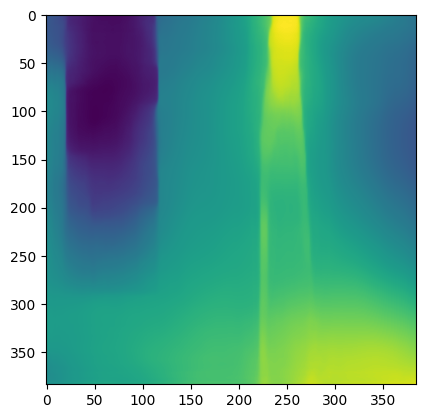

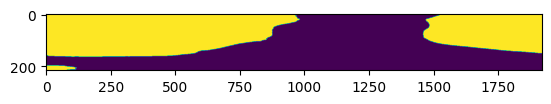

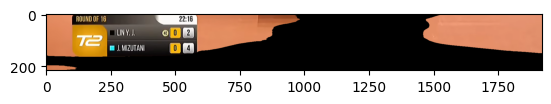

----------------------------------------------------


In [150]:
for i in range(5):
    print("Image {} :".format(i))
    detect_interest_zone_thresh_inv("../data/tennis de table/{}.png".format(i), display_all=True, threshold=190, show_first=True)
    print("----------------------------------------------------")

Ce premier test nous montre qu'il n'y a pas vraiment de cas où cette méthode de détection de zone d'intérêt est vraiment utile pour le tennis de table. Il serait même meilleur de crop les coins de l'image, réaliser de l'ocr sur les quatre et garder la partie avec des chiffres (souvent en haut à gauche ou en bas à gauche)